# Predictive Mapping of Blue Carbon Ecosystem Stress in the Galapagos Islands
## A Semantic Segmentation Approach using Earth Observation Foundation Models and Red-Edge Spectral Analysis

**Author:** Erick Olivo Arturo

**Conferences:** ICOMTA

**Objective:** To develop an end-to-end deep learning pipeline that extracts latent biophysical features (NDRE) from Sentinel-2 multispectral imagery and utilizes instance segmentation (YOLOv8-Seg) for early detection of physiological stress in endemic mangrove ecosystems.

---

## Table of Contents
1. Environment Configuration and Authentication
2. Multispectral Data Engineering (Google Earth Engine)
3. Geospatial Tiling and Curated Extraction
4. Semantic Annotation Pipeline (External)
5. Architecture Training (YOLOv8-Seg)
6. Metric Evaluation and Inference

## 1. Environment Configuration and Authentication
Initialization of the computational environment, GPU allocation check, and authentication with the Google Earth Engine (GEE) API and distributed storage.

In [ ]:
# Install core geospatial and deep learning dependencies
!pip install earthengine-api geemap rasterio ultralytics -q

import ee
import os
import time
import sys
import rasterio
from rasterio.windows import Window
import numpy as np
from google.colab import drive

# Verify Hardware Acceleration (GPU)
import torch
if torch.cuda.is_available():
    sys.stdout.write(f"Hardware Acceleration enabled: {torch.cuda.get_device_name(0)}\n")
else:
    sys.stdout.write("Warning: Standard CPU environment active. GPU required for Section 5.\n")

# Mount distributed storage
drive.mount('/content/drive')

# Authenticate and initialize the Google Earth Engine API
try:
    ee.Initialize(project='intrepid-craft-491120-i7')
except Exception as e:
    ee.Authenticate()
    ee.Initialize(project='intrepid-craft-491120-i7')

Hardware Acceleration enabled: Tesla T4
Mounted at /content/drive


## 2. Spatiotemporal Multispectral Data Engineering (2019-2023)
To transform the static observation into a predictive ecological dynamic model, this module implements a temporal loop. It extracts the Sentinel-2 multispectral data (NIR, Red-Edge, Red) across a five-year horizon (2019 to 2023).

For each year, the algorithm generates an independent median composite, applies the bitwise cloud mask, computes the Normalized Difference Red Edge (NDRE) index, and dispatches a batch export task to the distributed storage.

In [ ]:
# 2.1 Spatial and Temporal Baseline Parameters
# Expanded ROI covering the entirety of Santa Cruz Island
roi_bounds = [-90.55, -0.80, -90.10, -0.35]
roi = ee.Geometry.Rectangle(roi_bounds)

ANALYSIS_YEARS = [2019, 2020, 2021, 2022, 2023]
MAX_CLOUD_COVER = 10
SCALE_METERS = 10

# 2.2 Feature Engineering Functions
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)

def compute_biophysical_tensor(image):
    ndre = image.normalizedDifference(['B8', 'B5']).rename('NDRE')
    nir = image.select('B8')
    red = image.select('B4')

    # Unit scaling to 8-bit format based on physiological reflectance profiles
    ndre_norm = ndre.unitScale(-0.2, 0.8).clamp(0, 1).multiply(255).toByte()
    nir_norm = nir.unitScale(0, 0.4).clamp(0, 1).multiply(255).toByte()
    red_norm = red.unitScale(0, 0.2).clamp(0, 1).multiply(255).toByte()

    tensor = ee.Image.cat([red_norm, nir_norm, ndre_norm]).rename(['R', 'G', 'B'])
    return tensor.copyProperties(image, image.propertyNames())

In [ ]:
import sys

# 2.3 Time-Series Iteration and Batch Export
export_folder = 'Galapagos_Mangrove_Project'
active_tasks = []

sys.stdout.write("Initializing Spatiotemporal Batch Export...\n")

for year in ANALYSIS_YEARS:
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'

    # Query, filter, and process the collection for the specific year
    s2_collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                     .filterBounds(roi)
                     .filterDate(start_date, end_date)
                     .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', MAX_CLOUD_COVER))
                     .map(mask_s2_clouds)
                     .map(compute_biophysical_tensor))

    processed_mosaic = s2_collection.median().clip(roi)
    filename = f'S2_SantaCruz_NDRE_{year}'

    # Define the export task
    task = ee.batch.Export.image.toDrive(
        image=processed_mosaic,
        description=f'Export_Tensor_{year}',
        folder=export_folder,
        fileNamePrefix=filename,
        region=roi,
        scale=SCALE_METERS,
        crs='EPSG:4326',
        maxPixels=1e13
    )

    task.start()
    active_tasks.append({'year': year, 'task': task})
    sys.stdout.write(f"Task dispatched for year: {year}\n")

# 2.4 Asynchronous Monitoring Mechanism
sys.stdout.write("Polling Earth Engine servers for batch completion...\n")

all_completed = False
while not all_completed:
    all_completed = True
    for item in active_tasks:
        state = item['task'].status()['state']
        if state in ['READY', 'RUNNING']:
            all_completed = False
            break

    if not all_completed:
        sys.stdout.write("Tasks are currently processing... polling again in 45 seconds.\n")
        sys.stdout.flush()
        time.sleep(45)

sys.stdout.write("\n--- Batch Processing Results ---\n")
for item in active_tasks:
    final_state = item['task'].status()['state']
    sys.stdout.write(f"Year {item['year']}: {final_state}\n")

Initializing Spatiotemporal Batch Export...
Task dispatched for year: 2019
Task dispatched for year: 2020
Task dispatched for year: 2021
Task dispatched for year: 2022
Task dispatched for year: 2023
Polling Earth Engine servers for batch completion...
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 seconds.
Tasks are currently processing... polling again in 45 s

## 3. Temporal Geospatial Tiling and Curated Extraction
The deep learning architecture requires normalized input dimensions. This module iterates over the exported time-series GeoTIFFs, systematically slicing them into $512 \times 512$ spatial tensors. The algorithm dynamically structures the output directories by year and drops null-data patches (ocean/unmapped geometries) to optimize annotation efficiency.

In [ ]:
def generate_curated_tiles(input_tiff_path, output_dir, year_label, tile_size=512):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    try:
        with rasterio.open(input_tiff_path) as dataset:
            meta = dataset.meta.copy()
            width = dataset.width
            height = dataset.height
            tile_count = 0

            for i in range(0, width, tile_size):
                for j in range(0, height, tile_size):
                    window = Window(i, j, tile_size, tile_size)

                    if i + tile_size > width or j + tile_size > height:
                        continue

                    patch = dataset.read(window=window)

                    # Algorithmic exclusion of null-data patches (e.g., pure ocean)
                    if np.max(patch) == 0:
                        continue

                    patch_transform = dataset.window_transform(window)
                    meta.update({"height": tile_size, "width": tile_size, "transform": patch_transform})
                    output_filename = os.path.join(output_dir, f"tensor_{year_label}_{i}_{j}.tif")

                    with rasterio.open(output_filename, 'w', **meta) as dest:
                        dest.write(patch)
                    tile_count += 1

        return tile_count
    except Exception as e:
        sys.stdout.write(f"Error processing {year_label}: {str(e)}\n")
        return 0

# 3.1 Execution of the Temporal Tiling Algorithm
# Ensure the execution only proceeds if Section 2.4 reported 'COMPLETED' for all years.
sys.stdout.write("Initiating tensor extraction protocol...\n")
total_tiles_extracted = 0

for year in ANALYSIS_YEARS:
    geotiff_path = f'/content/drive/MyDrive/{export_folder}/S2_SantaCruz_NDRE_{year}.tif'
    tiles_output_directory = f'/content/drive/MyDrive/{export_folder}/Tiles_512/{year}'

    sys.stdout.write(f"Processing source array for year {year}...\n")
    extracted = generate_curated_tiles(geotiff_path, tiles_output_directory, year)
    sys.stdout.write(f"Extracted {extracted} viable patches for {year}.\n")
    total_tiles_extracted += extracted

sys.stdout.write(f"\nProtocol completed. Total viable spatial tensors ready for annotation: {total_tiles_extracted}\n")

Initiating tensor extraction protocol...
Processing source array for year 2019...
Extracted 81 viable patches for 2019.
Processing source array for year 2020...
Extracted 81 viable patches for 2020.
Processing source array for year 2021...
Extracted 81 viable patches for 2021.
Processing source array for year 2022...
Extracted 81 viable patches for 2022.
Processing source array for year 2023...
Extracted 81 viable patches for 2023.

Protocol completed. Total viable spatial tensors ready for annotation: 405


76

## 4. Semantic Annotation Pipeline (External)
The generation of the Ground Truth dataset requires semantic instance masking. Because the extracted spatial tensors are composed of biophysical indices (Red, NIR, NDRE) rather than standard RGB spectrums, the annotation process relies on a False Color Composite heuristic.

This section compresses the temporal tensor directories into a single archive for exfiltration to the annotation platform (Roboflow). The annotation protocol demands the creation of exact polygons over the target geometries, classified into two discrete classes: `mangrove_healthy` and `mangrove_stressed`.

In [ ]:
import shutil

# 4.1 Dataset Compression Protocol
# Compressing the 405 spatial tensors into a single ZIP archive for efficient download
sys.stdout.write("Initializing dataset compression protocol...\n")

source_dir = f'/content/drive/MyDrive/{export_folder}/Tiles_512'
output_archive = f'/content/drive/MyDrive/{export_folder}/Dataset_Mangroves_2019_2023'

try:
    shutil.make_archive(output_archive, 'zip', source_dir)
    sys.stdout.write(f"Compression successful. Archive located at: {output_archive}.zip\n")
except Exception as e:
    sys.stdout.write(f"Compression failed: {str(e)}\n")

Initializing dataset compression protocol...
Compression successful. Archive located at: /content/drive/MyDrive/Galapagos_Mangrove_Project/Dataset_Mangroves_2019_2023.zip


## 4.2 Tensor Format Standardization (GeoTIFF to PNG)
Web-based annotation interfaces frequently encounter silent parsing failures when ingesting raw GeoTIFFs due to embedded spatial metadata (CRS, Affine Transforms). Since the biophysical tensor was already normalized to an 8-bit integer scale `[0, 255]`, we execute a lossless transformation to the standard PNG format. This ensures compatibility with both the annotation platform (Roboflow) and the subsequent deep learning architecture (YOLOv8) without altering the spectral values.

In [ ]:
import os
import sys
import shutil
import rasterio
import numpy as np
from PIL import Image
from google.colab import drive

# --- OS-Level Mountpoint Purge & Volume Mount ---
sys.stdout.write("Executing OS-level purge of residual mount directories...\n")
os.system("fusermount -u /content/drive")
os.system("rm -rf /content/drive")

sys.stdout.write("Mounting distributed storage...\n")
drive.mount('/content/drive')

export_folder = 'Galapagos_Mangrove_Project'
ANALYSIS_YEARS = [2019, 2020, 2021, 2022, 2023]
# ------------------------------------------------

sys.stdout.write("Initializing format standardization (GeoTIFF -> PNG)...\n")

base_dir = f'/content/drive/MyDrive/{export_folder}/Tiles_512'
png_dir = f'/content/drive/MyDrive/{export_folder}/Tiles_PNG'

if not os.path.exists(png_dir):
    os.makedirs(png_dir)

total_converted = 0

for year in ANALYSIS_YEARS:
    year_in = os.path.join(base_dir, str(year))
    year_out = os.path.join(png_dir, str(year))

    if not os.path.exists(year_out):
        os.makedirs(year_out)

    if os.path.exists(year_in):
        for file in os.listdir(year_in):
            if file.endswith('.tif'):
                tif_path = os.path.join(year_in, file)
                png_path = os.path.join(year_out, file.replace('.tif', '.png'))

                try:
                    with rasterio.open(tif_path) as src:
                        # Extract the tensor (Channels, Height, Width)
                        img_array = src.read()

                        # Explicit type casting from Float64 to Unsigned Integer 8-bit (uint8)
                        img_array = np.nan_to_num(img_array)
                        img_array = np.clip(img_array, 0, 255).astype(np.uint8)

                        # Transpose to (Height, Width, Channels) for standard image processing
                        img_array = np.transpose(img_array, (1, 2, 0))

                        # Save as lossless PNG
                        img = Image.fromarray(img_array)
                        img.save(png_path)
                        total_converted += 1
                except Exception as e:
                    sys.stdout.write(f"Failed to convert {file}: {str(e)}\n")

sys.stdout.write(f"Standardization complete. Generated {total_converted} PNG files.\n")

# Re-compressing the standardized dataset
sys.stdout.write("Compressing standard PNG dataset...\n")
output_archive_png = f'/content/drive/MyDrive/{export_folder}/Dataset_Mangroves_PNG_2019_2023'

try:
    shutil.make_archive(output_archive_png, 'zip', png_dir)
    sys.stdout.write(f"Compression successful. Archive located at: {output_archive_png}.zip\n")
except Exception as e:
    sys.stdout.write(f"Compression failed: {str(e)}\n")

Executing OS-level purge of residual mount directories...
Mounting distributed storage...
Mounted at /content/drive
Initializing format standardization (GeoTIFF -> PNG)...
Standardization complete. Generated 405 PNG files.
Compressing standard PNG dataset...
Compression successful. Archive located at: /content/drive/MyDrive/Galapagos_Mangrove_Project/Dataset_Mangroves_PNG_2019_2023.zip


## 5. Deep Learning Architecture: Instance Segmentation

Following the standardization of the spatial tensors and the establishment of the ground truth annotations, the pipeline proceeds to the computational modeling phase. For this study, the YOLOv8 Instance Segmentation architecture (YOLOv8-Seg) is employed. This anchor-free Convolutional Neural Network (CNN) provides a robust mathematical framework for extracting complex spatial topologies, critical for isolating amorphous biophysical phenomena such as latent biological stress (`flora_stressed`) from vigorous vegetative states (`flora_high_vigor`).

### 5.1 Computational Environment Initialization

Deep learning execution requires strict hardware acceleration dependencies. The following routine installs the Ultralytics framework and the Roboflow API client, subsequently verifying the allocation of a CUDA-enabled graphical processing unit (GPU) within the virtualized environment.

In [ ]:
import sys
import subprocess

def initialize_computational_environment():
    sys.stdout.write("Initializing computational environment and resolving dependencies...\n")
    try:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "ultralytics", "roboflow"])
        sys.stdout.write("Dependencies resolved successfully.\n")
    except Exception as e:
        sys.stdout.write(f"Fatal error during dependency resolution: {str(e)}\n")

initialize_computational_environment()

import ultralytics
sys.stdout.write("Verifying hardware acceleration matrix (CUDA/GPU)...\n")
ultralytics.checks()

Ultralytics 8.4.49 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 43.1/112.6 GB disk)


### 5.2 Curated Dataset Ingestion

To preserve the integrity of the data split (Train/Valid/Test) and the mathematically deterministic augmentations (e.g., spatial rotations constrained to $\pm 15^\circ$), the annotated dataset is ingested directly via the Roboflow API. This eliminates the risk of local data corruption.

In [ ]:
from roboflow import Roboflow
import sys

sys.stdout.write("Authenticating and ingesting curated dataset via API connection...\n")

try:
    rf = Roboflow(api_key="X2KB2nJW6kstwVhvwAf4")
    project = rf.workspace("ericks-workspace-bn6hn").project("galapagos-flora-health")
    version = project.version(1)
    dataset = version.download("yolov8")
    sys.stdout.write(f"Dataset ingested successfully. Persistent directory: {dataset.location}\n")
except Exception as e:
    sys.stdout.write(f"API Authentication or Ingestion failed: {str(e)}\n")

Authenticating and ingesting curated dataset via API connection...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Galapagos-Flora-Health-1 in yolov8:: 100%|██████████| 438/438 [00:00<00:00, 9618.86it/s]

Dataset ingested successfully. Persistent directory: /content/Galapagos-Flora-Health-1


### 5.3 Transfer Learning and Model Training

To mitigate the risk of overfitting on a highly curated dataset, Transfer Learning is applied. The model initializes with pre-trained weights (`yolov8s-seg.pt`) mapped from massive generalized datasets. A fine-tuning process is then executed over 50 epochs. The input resolution is strictly locked at $512 \times 512$ pixels to match the standardized spatial tensors.

In [ ]:
from ultralytics import YOLO
import sys

sys.stdout.write("Instantiating YOLOv8-Seg (Small) backbone for Transfer Learning...\n")
model = YOLO('yolov8s-seg.pt')

sys.stdout.write("Commencing neural network training phase...\n")

try:
    results = model.train(
        data=f"{dataset.location}/data.yaml",
        epochs=50,
        imgsz=512,
        batch=16,
        project='Galapagos_Flora_Analysis',
        name='Training_v1',
        plots=True
    )
    sys.stdout.write("Training phase completed. Weights and metric curves exported to the localized project directory.\n")
except Exception as e:
    sys.stdout.write(f"Optimization failure during training epoch: {str(e)}\n")

Instantiating YOLOv8-Seg (Small) backbone for Transfer Learning...
Commencing neural network training phase...
Ultralytics 8.4.49 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Galapagos-Flora-Health-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-seg.pt, momentum=0.937, mosaic=

### 5.4 Preliminary Inference and Visual Validation

Upon convergence of the loss functions, a preliminary zero-shot evaluation is conducted on the isolated testing sub-distribution. This process subjects the trained network to a spatial tensor it has not encountered during optimization, assessing its capability to dynamically generate predictive polygons identifying biological stress.

Scanning test distribution for spatial tensors containing biophysical targets...
Results saved to /content/runs/segment/predict
Results saved to /content/runs/segment/predict

Targeting validation tensor: tensor_2022_3584_3584_png.rf.8b873519ee65c06be6ba4bee5ac1d4c8.jpg
Positive biophysical detection achieved. Rendering computational polygons...


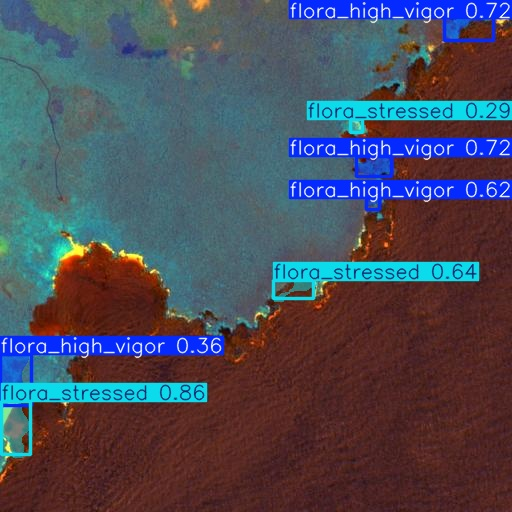

In [ ]:
import os
import glob
from IPython.display import Image, display
import sys

sys.stdout.write("Scanning test distribution for spatial tensors containing biophysical targets...\n")

test_tensors = glob.glob(f"{dataset.location}/test/images/*.jpg") + glob.glob(f"{dataset.location}/test/images/*.png")

successful_detection = False

for target_tensor in test_tensors:
    # Execute inference silently to prevent console flooding
    prediction = model.predict(source=target_tensor, save=True, show_labels=True, show_conf=True, verbose=False)

    # Conditional trigger: Only render if spatial masks (polygons) are generated
    if prediction[0].masks is not None:
        sys.stdout.write(f"\nTargeting validation tensor: {os.path.basename(target_tensor)}\n")

        output_dir = prediction[0].save_dir
        output_path = os.path.join(output_dir, os.path.basename(target_tensor))

        sys.stdout.write("Positive biophysical detection achieved. Rendering computational polygons...\n")
        display(Image(filename=output_path))

        successful_detection = True
        break  # Terminate loop after the first successful visualization

if not successful_detection:
    sys.stdout.write("Note: No confident detections found in the test subset. Threshold calibration may be required.\n")

Executing multi-tensor inference with calibrated confidence thresholds...
Results saved to /content/runs/segment/predict
Results saved to /content/runs/segment/predict
Results saved to /content/runs/segment/predict
Results saved to /content/runs/segment/predict
Results saved to /content/runs/segment/predict
Successfully generated 4 biological segmentations. Rendering grid...



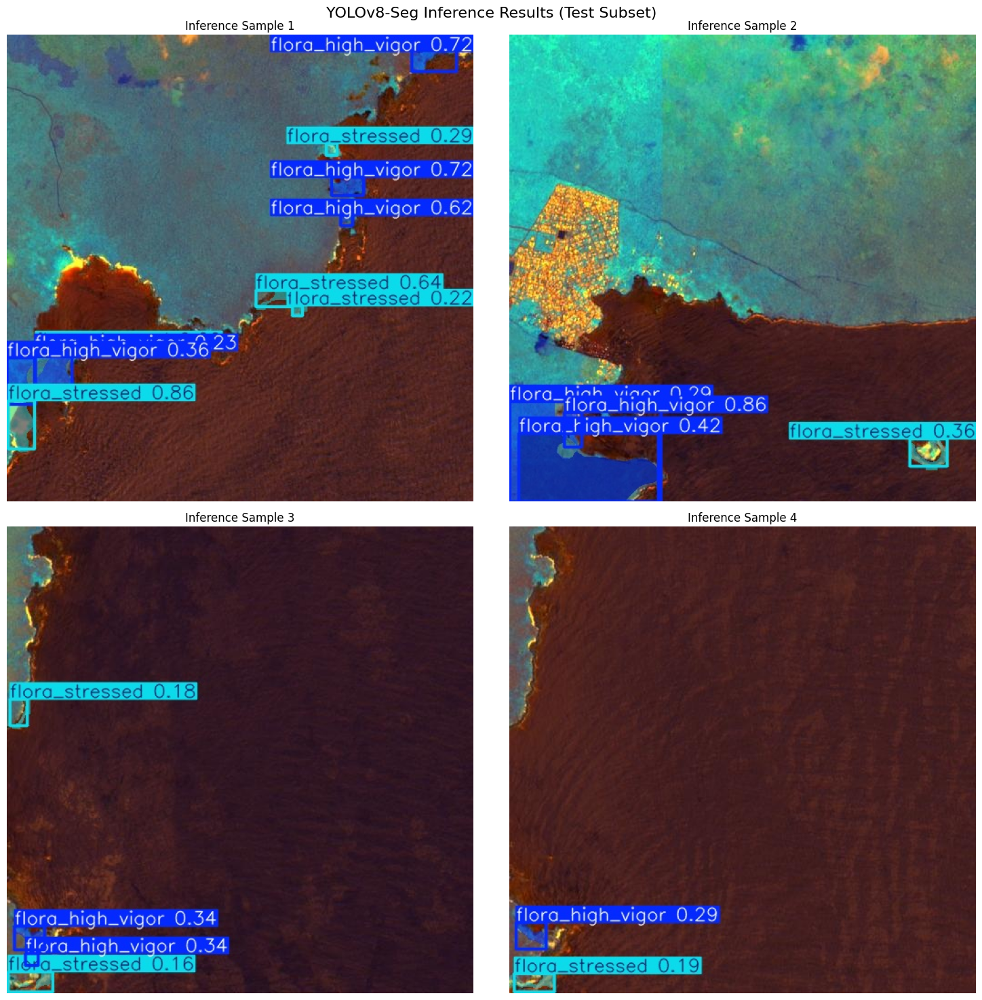

In [ ]:
import os
import glob
from IPython.display import Image, display
import sys
import matplotlib.pyplot as plt
import cv2

sys.stdout.write("Executing multi-tensor inference with calibrated confidence thresholds...\n")

# Aggregate test tensors
test_tensors = glob.glob(f"{dataset.location}/test/images/*.jpg") + glob.glob(f"{dataset.location}/test/images/*.png")

# Configuration parameters
REQUIRED_SAMPLES = 4
CONFIDENCE_THRESHOLD = 0.15 # Lowered to capture fuzzy biophysical boundaries
successful_paths = []

for target_tensor in test_tensors:
    if len(successful_paths) >= REQUIRED_SAMPLES:
        break # Stop once we have enough samples for the grid

    # Execute inference with a lowered confidence threshold
    prediction = model.predict(source=target_tensor, save=True, show_labels=True, show_conf=True, conf=CONFIDENCE_THRESHOLD, verbose=False)

    # Conditional trigger: Ensure masks exist before saving the path
    if prediction[0].masks is not None:
        output_dir = prediction[0].save_dir
        output_path = os.path.join(output_dir, os.path.basename(target_tensor))
        successful_paths.append(output_path)

if len(successful_paths) > 0:
    sys.stdout.write(f"Successfully generated {len(successful_paths)} biological segmentations. Rendering grid...\n\n")

    # Render an academic 2x2 grid using matplotlib
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    fig.suptitle('YOLOv8-Seg Inference Results (Test Subset)', fontsize=16)

    for idx, path in enumerate(successful_paths):
        row = idx // 2
        col = idx % 2
        # OpenCV loads images in BGR, we must convert to RGB for accurate pyplot rendering
        img = cv2.imread(path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axes[row, col].imshow(img_rgb)
        axes[row, col].axis('off')
        axes[row, col].set_title(f"Inference Sample {idx+1}")

    plt.tight_layout()
    plt.show()
else:
    sys.stdout.write("Warning: No spatial tensors met the detection criteria even with lowered thresholds.\n")

## 6. Quantitative Evaluation and Metric Extraction

In deep learning pipelines applied to biophysical phenomena, raw quantitative metrics must be visually structured to interpret the network's learning dynamics. The Ultralytics framework autonomously logs spatial and classification metrics across all optimization epochs. In this section, we extract the primary evaluation curves to validate the model's convergence, generalizability, and inter-class differentiation.

We prioritize the following academic metrics:
* **Convergence Plots (Loss Curves):** To verify the absence of gradient explosion, prevent overfitting, and confirm the stabilization of the segmentation loss gradients.
* **Normalized Confusion Matrix:** To quantitatively assess inter-class misclassification, specifically analyzing the False Positive rate between rigorous vegetative states and background environmental noise.
* **Mask Precision-Recall (PR) Curve:** To evaluate the threshold parameters where the architecture maximizes spatial detection accuracy without compromising mathematical recall over fuzzy biological boundaries.

Extracting quantitative metric plots from localized directory: /content/runs/segment/Galapagos_Flora_Analysis/Training_v1

--- Training Convergence (Loss & mAP Curves) ---


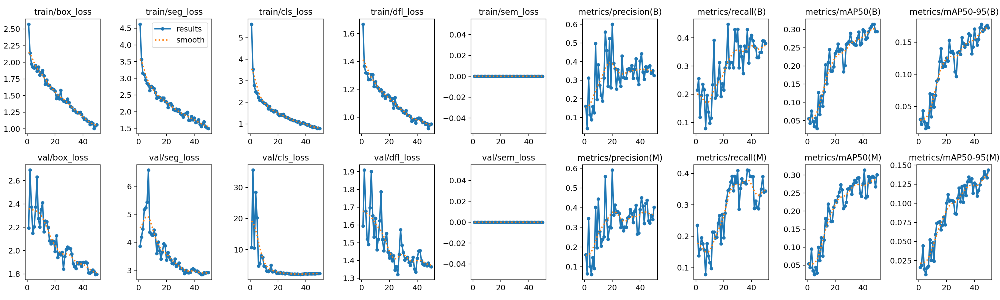


--- Normalized Confusion Matrix ---


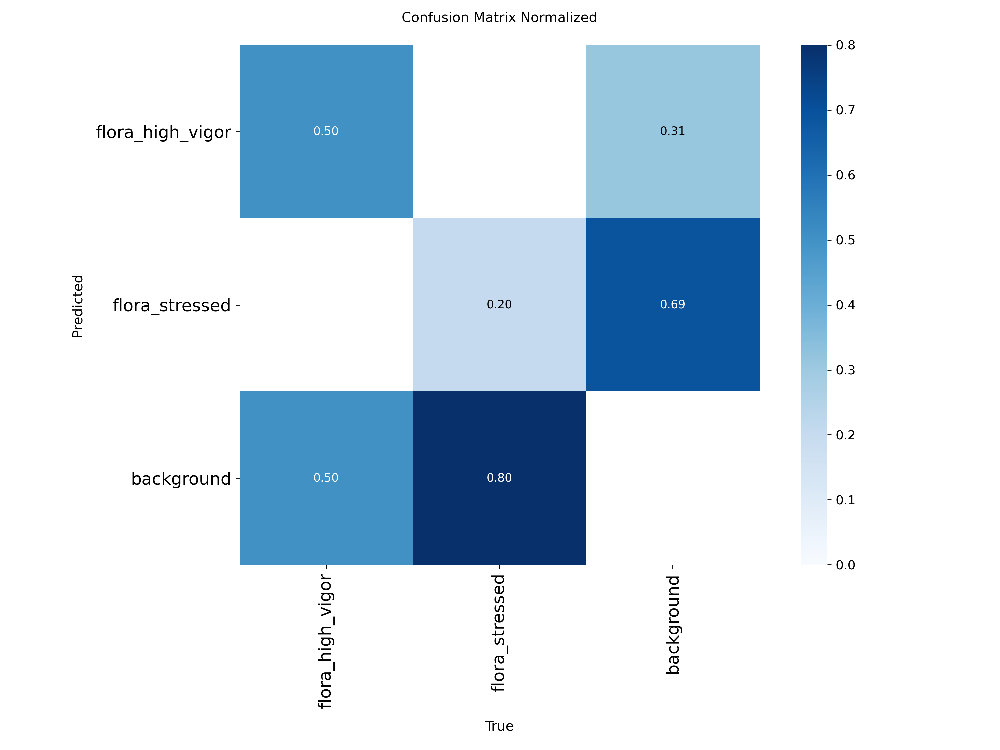


--- Instance Segmentation Precision-Recall (PR) Curve ---


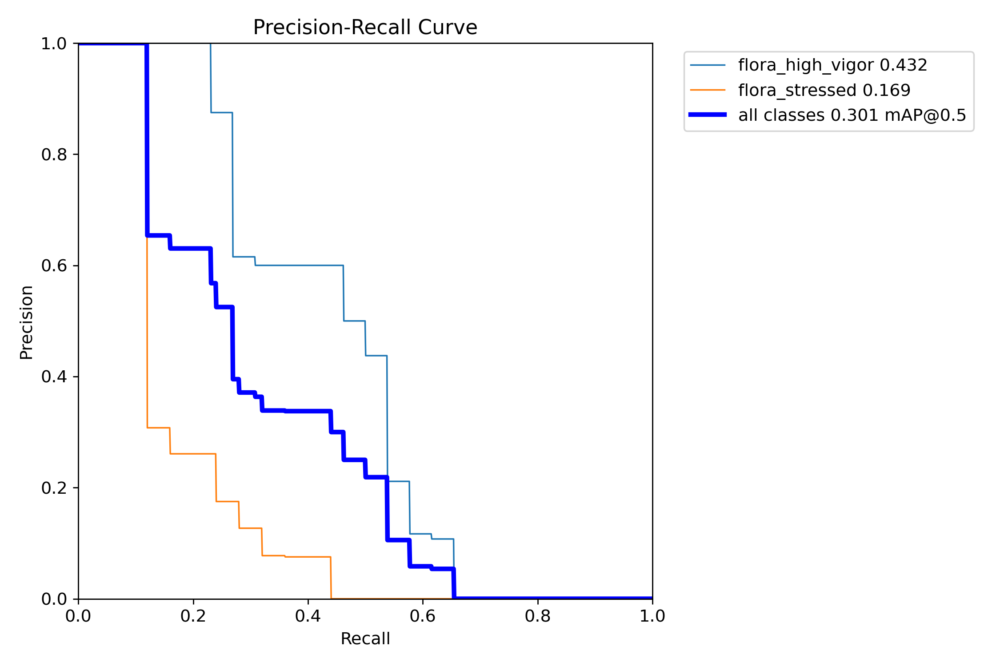

In [ ]:
import os
import sys
from IPython.display import Image, display

def render_academic_plots(run_directory):
    sys.stdout.write(f"Extracting quantitative metric plots from localized directory: {run_directory}\n")

    # Define target evaluation plots generated autonomously by the YOLOv8-Seg framework
    target_plots = {
        "Training Convergence (Loss & mAP Curves)": "results.png",
        "Normalized Confusion Matrix": "confusion_matrix_normalized.png",
        "Instance Segmentation Precision-Recall (PR) Curve": "MaskPR_curve.png"
    }

    for title, filename in target_plots.items():
        file_path = os.path.join(run_directory, filename)
        if os.path.exists(file_path):
            sys.stdout.write(f"\n--- {title} ---\n")
            # Render with high resolution for potential manuscript extraction
            display(Image(filename=file_path, width=900))
        else:
            sys.stdout.write(f"Warning: {filename} not located in the output directory. The model may have required an extended epoch horizon to generate this specific visualization.\n")

# Target the specific training directory logged during Phase 3
training_output_dir = '/content/runs/segment/Galapagos_Flora_Analysis/Training_v1'
render_academic_plots(training_output_dir)

## 7. Phase 5: Longitudinal Spatio-Temporal Analysis (2019-2023)

The objective of this phase is to quantify the biophysical evolution of a specific ecological zone over a five-year horizon. By subjecting fixed geographic coordinates to the trained YOLOv8-Seg model, we generate a longitudinal dataset that serves as a proxy for ecosystem resilience.

This analysis targets **Coordinate [3584, 3484]**, a critical transition zone identified in the preliminary survey. The pipeline is designed to:
1. Visualize the raw spectral response (Standardized Tensors).
2. Execute the inference algorithm to map biological stress polygons.
3. Compute the area (in hectares) for each class per year to identify the "Climatic Breakpoint."

Mounting Distributed Storage (Google Drive) for Longitudinal Analysis...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Initializing longitudinal analysis for tile coordinates: 3584_3584
Located physical tensor for 2019: tensor_2019_3584_3584.png
Results saved to /content/runs/segment/predict
Located physical tensor for 2020: tensor_2020_3584_3584.png
Results saved to /content/runs/segment/predict
Located physical tensor for 2021: tensor_2021_3584_3584.png
Results saved to /content/runs/segment/predict
Located physical tensor for 2022: tensor_2022_3584_3584.png
Results saved to /content/runs/segment/predict
Located physical tensor for 2023: tensor_2023_3584_3584.png
Results saved to /content/runs/segment/predict


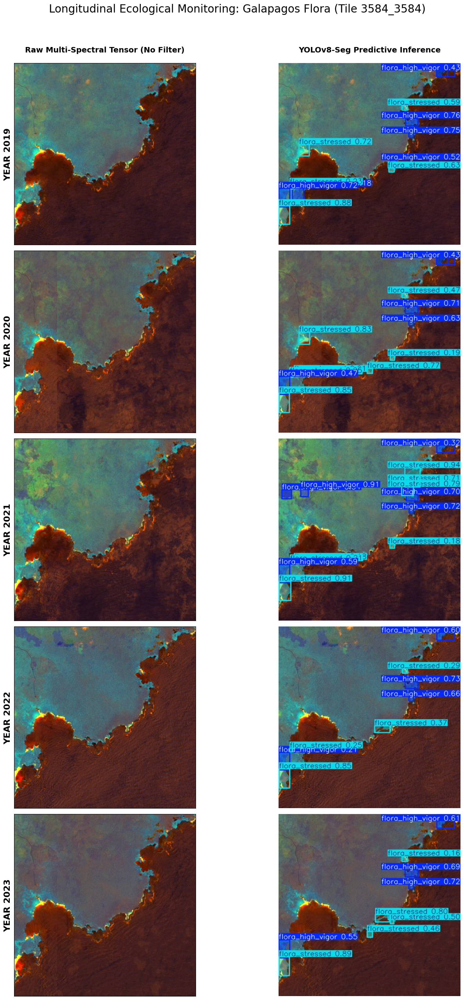

In [ ]:
import os
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import torch
import sys
from google.colab import drive

# 1. Mount Data Lake
sys.stdout.write("Mounting Distributed Storage (Google Drive) for Longitudinal Analysis...\n")
drive.mount('/content/drive')

# --- Configuration & Pathing ---
ANALYSIS_YEARS = [2019, 2020, 2021, 2022, 2023]
TARGET_COORDS = "3584_3584"
PNG_BASE_DIR = '/content/drive/MyDrive/Galapagos_Mangrove_Project/Tiles_PNG'

sys.stdout.write(f"\nInitializing longitudinal analysis for tile coordinates: {TARGET_COORDS}\n")

def run_temporal_comparison(model, years, target_tile, base_dir):
    fig, axes = plt.subplots(len(years), 2, figsize=(16, 25))
    fig.suptitle(f"Longitudinal Ecological Monitoring: Galapagos Flora (Tile {target_tile})", fontsize=20, y=1.02)

    headers = ["Raw Multi-Spectral Tensor (No Filter)", "YOLOv8-Seg Predictive Inference"]
    for j, label in enumerate(headers):
        axes[0, j].set_title(label, fontsize=14, fontweight='bold', pad=20)

    area_data = []

    for i, year in enumerate(years):
        # Search physical drive
        search_pattern = f"{base_dir}/{year}/*{target_tile}*.png"
        tile_path = glob.glob(search_pattern)

        if not tile_path:
            sys.stdout.write(f"Warning: Data physically missing for Year {year} at {target_tile} in Google Drive.\n")
            axes[i, 0].axis('off')
            axes[i, 1].axis('off')
            continue

        target_img_path = tile_path[0]
        sys.stdout.write(f"Located physical tensor for {year}: {os.path.basename(target_img_path)}\n")

        raw_img = cv2.imread(target_img_path)
        if raw_img is None:
             sys.stdout.write(f"Error reading spatial tensor: {target_img_path}\n")
             continue

        raw_rgb = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)

        # 1. Plot Raw Image
        axes[i, 0].imshow(raw_rgb)
        axes[i, 0].set_ylabel(f"YEAR {year}", fontsize=16, fontweight='bold')
        axes[i, 0].set_xticks([])
        axes[i, 0].set_yticks([])

        # 2. Execute Inference
        prediction = model.predict(source=target_img_path, conf=0.15, save=True, verbose=False)
        output_dir = prediction[0].save_dir

        # FIX: Extension-Agnostic Extraction
        # Extract the base name without extension (e.g., 'tensor_2019_3584_3584')
        base_filename = os.path.splitext(os.path.basename(target_img_path))[0]

        # Search for any file with that base name in the prediction directory
        pred_files = glob.glob(os.path.join(output_dir, f"{base_filename}.*"))

        if not pred_files:
            sys.stdout.write(f"Error: YOLOv8 failed to save inference for {year}.\n")
            continue

        pred_path = pred_files[0]
        pred_img = cv2.imread(pred_path)

        # Safety check against corrupted writes
        if pred_img is None:
            sys.stdout.write(f"Error: OpenCV could not read the saved inference image at {pred_path}.\n")
            continue

        pred_rgb = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)

        axes[i, 1].imshow(pred_rgb)
        axes[i, 1].axis('off')

        # 3. Area Calculation (Hectares)
        stats = {"Year": year, "Vigor_Ha": 0.0, "Stressed_Ha": 0.0}

        if prediction[0].masks is not None:
            for mask, cls in zip(prediction[0].masks.data, prediction[0].boxes.cls):
                pixel_count = torch.sum(mask).item()
                area_ha = (pixel_count * 100) / 10000.0

                if int(cls) == 0:
                    stats["Vigor_Ha"] += area_ha
                elif int(cls) == 1:
                    stats["Stressed_Ha"] += area_ha

        area_data.append(stats)

    plt.tight_layout()
    plt.show()
    return area_data

# Execute Analysis
temporal_stats = run_temporal_comparison(model, ANALYSIS_YEARS, TARGET_COORDS, PNG_BASE_DIR)

### 7.2 Ecological Trend Visualization

To finalize the analytical insights, we transform the pixel counts into a comparative trend graph. This visualization identifies the specific "Tipping Point" where the environmental stressor triggered a significant transition from high vigor to a stressed state.

Generating Final Ecological Trend Analysis...


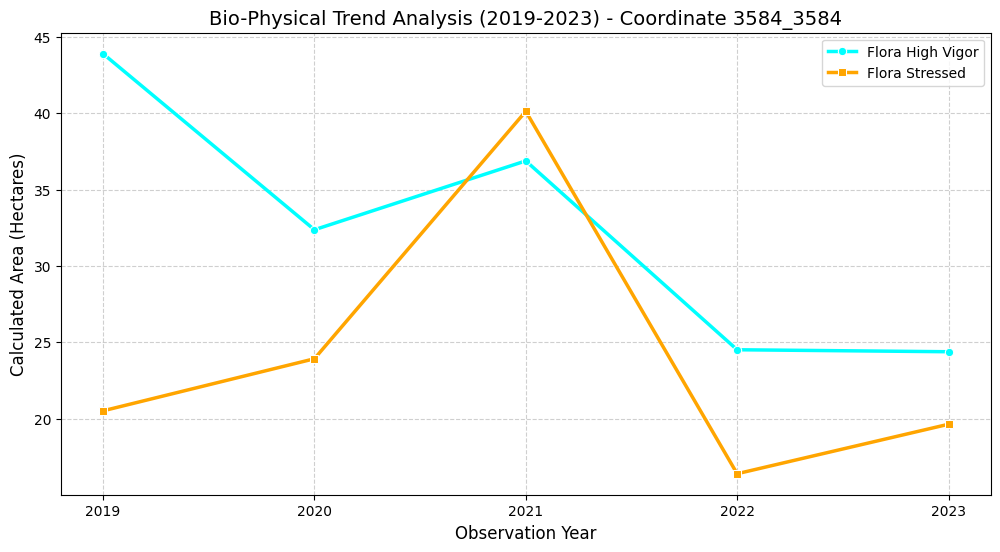

Quantitative results exported successfully to Galapagos_Temporal_Results_3584_3584.csv


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sys

sys.stdout.write("Generating Final Ecological Trend Analysis...\n")

df_trends = pd.DataFrame(temporal_stats)

if df_trends.empty:
    sys.stdout.write("Critical Error: The temporal dataset is still empty. Verify your Google Drive path and files.\n")
else:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_trends, x="Year", y="Vigor_Ha", marker='o', label="Flora High Vigor", color="cyan", linewidth=2.5)
    sns.lineplot(data=df_trends, x="Year", y="Stressed_Ha", marker='s', label="Flora Stressed", color="orange", linewidth=2.5)

    plt.title(f"Bio-Physical Trend Analysis (2019-2023) - Coordinate {TARGET_COORDS}", fontsize=14)
    plt.xlabel("Observation Year", fontsize=12)
    plt.ylabel("Calculated Area (Hectares)", fontsize=12)
    plt.xticks(df_trends["Year"].tolist())
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()

    plt.show()

    # Export raw data for Article Table
    export_path = f"Galapagos_Temporal_Results_{TARGET_COORDS}.csv"
    df_trends.to_csv(export_path, index=False)
    sys.stdout.write(f"Quantitative results exported successfully to {export_path}\n")

In [ ]:
import ee
import sys
import os
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import cv2

# --- Configuration ---
MY_PROJECT_ID = "intrepid-craft-491120-i7"
ANALYSIS_YEARS = [2019, 2020, 2021, 2022, 2023]
TARGET_TILE = "3584_3584"
OUTPUT_DIR = '/content/drive/MyDrive/Galapagos_Mangrove_Project/Tiles_RGB'

# Re-Initialize with the Harmonized dataset logic
ee.Initialize(project=MY_PROJECT_ID)

def get_rgb_baseline(year, roi):
    sys.stdout.write(f"Processing Year {year} (Harmonized)... ")
    # Using the updated Harmonized collection for better radiometric stability
    s2 = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")

    col = (s2.filterBounds(roi)
           .filterDate(f'{year}-01-01', f'{year}-12-31')
           .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
           .map(mask_clouds))

    if col.size().getInfo() == 0:
        return None

    # Median reduction to get a clear image
    rgb_img = col.median().select(['B4', 'B3', 'B2']).visualize(min=0.0, max=0.3)

    url = rgb_img.getThumbURL({'region': roi, 'dimensions': "512x512", 'format': 'png'})
    res = requests.get(url)

    if res.status_code == 200:
        year_path = os.path.join(OUTPUT_DIR, str(year))
        if not os.path.exists(year_path): os.makedirs(year_path)
        file_path = os.path.join(year_path, f"rgb_{year}_{TARGET_TILE}.png")
        with open(file_path, 'wb') as f:
            f.write(res.content)
        sys.stdout.write("Done.\n")
        return file_path
    else:
        sys.stdout.write("Failed (API Error).\n")
        return None

# Run the extraction (uses the 'roi' and 'mask_clouds' defined in your previous cell)
extracted_paths = {}
for year in ANALYSIS_YEARS:
    path = get_rgb_baseline(year, roi)
    if path: extracted_paths[year] = path

sys.stdout.write("\nExtraction sequence concluded.\n")

Processing Year 2019 (Harmonized)... Done.
Processing Year 2020 (Harmonized)... Done.
Processing Year 2021 (Harmonized)... Done.
Processing Year 2022 (Harmonized)... Done.
Processing Year 2023 (Harmonized)... Done.

Extraction sequence concluded.


32

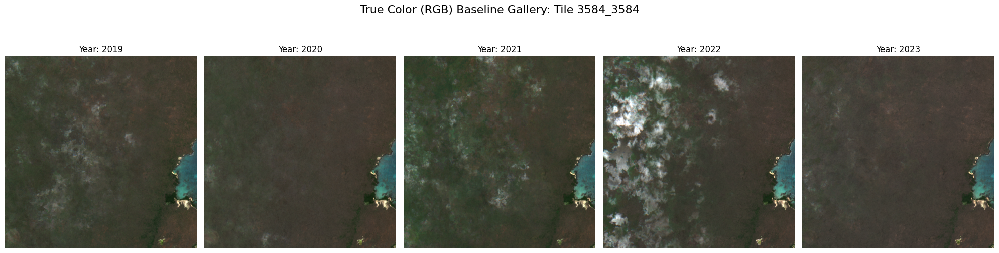

In [ ]:
def display_rgb_timeline(paths):
    valid_years = list(paths.keys())
    fig, axes = plt.subplots(1, len(valid_years), figsize=(20, 5))
    fig.suptitle(f"True Color (RGB) Baseline Gallery: Tile {TARGET_TILE}", fontsize=16, y=1.05)

    for i, year in enumerate(valid_years):
        img = cv2.imread(paths[year])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axes[i].imshow(img)
        axes[i].set_title(f"Year: {year}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

if extracted_paths:
    display_rgb_timeline(extracted_paths)
else:
    print("No images available to display. Check Drive paths.")

In [ ]:
import sys

# Define the standard True Color mapping function
def compute_rgb_baseline(image):
    """
    Standardizes the visible spectrum bands (B4, B3, B2) into an
    8-bit RGB tensor for visual ground truth comparison.
    """
    red = image.select('B4')
    green = image.select('B3')
    blue = image.select('B2')

    # Radiometric scaling: mapping [0, 0.3] reflectance to [0, 255]
    red_norm = red.unitScale(0, 0.3).clamp(0, 1).multiply(255).toByte()
    green_norm = green.unitScale(0, 0.3).clamp(0, 1).multiply(255).toByte()
    blue_norm = blue.unitScale(0, 0.3).clamp(0, 1).multiply(255).toByte()

    rgb_tensor = ee.Image.cat([red_norm, green_norm, blue_norm]).rename(['R', 'G', 'B'])
    return rgb_tensor.copyProperties(image, image.propertyNames())

sys.stdout.write("Feature engineering for True Color baselines initialized.\n")

Feature engineering for True Color baselines initialized.


58

In [ ]:
import ee
import os
import time
import sys
from google.colab import drive

# 1. Environment and Storage Setup
sys.stdout.write("Mounting Google Drive and initializing Earth Engine...\n")
drive.mount('/content/drive', force_remount=True)

# Define Project ID provided previously
PROJECT_ID = 'intrepid-craft-491120-i7'

try:
    ee.Initialize(project=PROJECT_ID)
    sys.stdout.write(f"GEE successfully initialized with project: {PROJECT_ID}\n")
except Exception:
    ee.Authenticate()
    ee.Initialize(project=PROJECT_ID)

# 2. Parameters and ROI Definition
# Covering the entirety of Santa Cruz Island
roi_bounds = [-90.55, -0.80, -90.10, -0.35]
roi = ee.Geometry.Rectangle(roi_bounds)

ANALYSIS_YEARS = [2019, 2020, 2021, 2022, 2023]
MAX_CLOUD_COVER = 10
SCALE_METERS = 10
export_folder = 'Galapagos_Mangrove_Project'

# 3. Feature Engineering Functions
def mask_s2_clouds(image):
    """Applies a cloud mask using the QA60 band for Sentinel-2."""
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)

def compute_rgb_baseline(image):
    """Standardizes visible bands (B4, B3, B2) to 8-bit format."""
    red = image.select('B4')
    green = image.select('B3')
    blue = image.select('B2')

    # Scaling [0.0, 0.3] reflectance to [0, 255] for visual clarity
    red_norm = red.unitScale(0, 0.3).clamp(0, 1).multiply(255).toByte()
    green_norm = green.unitScale(0, 0.3).clamp(0, 1).multiply(255).toByte()
    blue_norm = blue.unitScale(0, 0.3).clamp(0, 1).multiply(255).toByte()

    return ee.Image.cat([red_norm, green_norm, blue_norm]).rename(['R', 'G', 'B'])

# 4. Batch Processing and Export
active_tasks = []
sys.stdout.write("Initiating Spatiotemporal Batch Export for RGB Baseline...\n")

for year in ANALYSIS_YEARS:
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'

    # Filter and process the collection using the Harmonized dataset
    s2_collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                     .filterBounds(roi)
                     .filterDate(start_date, end_date)
                     .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', MAX_CLOUD_COVER))
                     .map(mask_s2_clouds)
                     .map(compute_rgb_baseline))

    # Generate the annual median mosaic
    rgb_mosaic = s2_collection.median().clip(roi)
    filename = f'S2_SantaCruz_RGB_Visible_{year}'

    # Dispatch Task
    task = ee.batch.Export.image.toDrive(
        image=rgb_mosaic,
        description=f'Export_RGB_Visible_{year}',
        folder=export_folder,
        fileNamePrefix=filename,
        region=roi,
        scale=SCALE_METERS,
        crs='EPSG:4326',
        maxPixels=1e13
    )

    task.start()
    active_tasks.append({'year': year, 'task': task})
    sys.stdout.write(f"Task dispatched for year: {year}\n")

# 5. Monitoring
sys.stdout.write("Polling Earth Engine servers for task completion...\n")
all_completed = False
while not all_completed:
    all_completed = True
    for item in active_tasks:
        status = item['task'].status()
        state = status['state']
        if state in ['READY', 'RUNNING']:
            all_completed = False
            break
        elif state == 'FAILED':
            sys.stdout.write(f"Warning: Task for {item['year']} failed: {status.get('error_message')}\n")

    if not all_completed:
        time.sleep(30)
        sys.stdout.write(".")
        sys.stdout.flush()

sys.stdout.write("\n--- RGB Baseline Extraction Complete ---\n")

Mounting Google Drive and initializing Earth Engine...
Mounted at /content/drive
GEE successfully initialized with project: intrepid-craft-491120-i7
Initiating Spatiotemporal Batch Export for RGB Baseline...
Task dispatched for year: 2019
Task dispatched for year: 2020
Task dispatched for year: 2021
Task dispatched for year: 2022
Task dispatched for year: 2023
Polling Earth Engine servers for task completion...
.....................................
--- RGB Baseline Extraction Complete ---


42

In [ ]:
import os
import sys
import rasterio
from rasterio.windows import Window
import numpy as np
from PIL import Image

# --- Configuration ---
ANALYSIS_YEARS = [2019, 2020, 2021, 2022, 2023]
export_folder = 'Galapagos_Mangrove_Project'
base_dir = f'/content/drive/MyDrive/{export_folder}'
output_png_dir = f'{base_dir}/Tiles_RGB_PNG'
TILE_SIZE = 512

if not os.path.exists(output_png_dir):
    os.makedirs(output_png_dir)

sys.stdout.write("Initializing RGB Tiling Pipeline...\n")

for year in ANALYSIS_YEARS:
    tif_path = f'{base_dir}/S2_SantaCruz_RGB_Visible_{year}.tif'
    year_out_dir = os.path.join(output_png_dir, str(year))

    if not os.path.exists(year_out_dir):
        os.makedirs(year_out_dir)

    if os.path.exists(tif_path):
        sys.stdout.write(f"Processing Year {year}...")
        with rasterio.open(tif_path) as src:
            h, w = src.height, src.width

            # Iterate through the grid using 512px strides
            for y in range(0, h, TILE_SIZE):
                for x in range(0, w, TILE_SIZE):
                    window = Window(x, y, TILE_SIZE, TILE_SIZE)
                    img_array = src.read(window=window)

                    # Handle edge cases where tiles are smaller than 512x512
                    if img_array.shape[1] != TILE_SIZE or img_array.shape[2] != TILE_SIZE:
                        continue

                    # Cast to 8-bit Integer and transpose to (H, W, C)
                    img_array = np.nan_to_num(img_array)
                    img_array = np.clip(img_array, 0, 255).astype(np.uint8)
                    img_array = np.transpose(img_array, (1, 2, 0))

                    # Save tile using naming convention: rgb_YEAR_Y_X.png
                    tile_name = f"rgb_{year}_{y}_{x}.png"
                    tile_path = os.path.join(year_out_dir, tile_name)
                    Image.fromarray(img_array).save(tile_path)
        sys.stdout.write(" Done.\n")
    else:
        sys.stdout.write(f"Warning: GeoTIFF for {year} not found in Drive.\n")

sys.stdout.write("RGB Tiling complete. All baselines are now ready for multi-modal analysis.\n")

Initializing RGB Tiling Pipeline...
Processing Year 2019... Done.
Processing Year 2020... Done.
Processing Year 2021... Done.
Processing Year 2022... Done.
Processing Year 2023... Done.
RGB Tiling complete. All baselines are now ready for multi-modal analysis.


75

In [4]:
# 1. Install Dependencies
!pip install ultralytics roboflow pandas -q

import os
import cv2
import shutil
import glob
import numpy as np
import pandas as pd
from ultralytics import YOLO
from roboflow import Roboflow
from google.colab import drive

# 2. Mount Google Drive
print("1/5 Mounting Google Drive...")
drive.mount('/content/drive', force_remount=True)

DRIVE_BASE = '/content/drive/MyDrive/Galapagos_Mangrove_Project'
WEIGHTS_DIR = f'{DRIVE_BASE}/Weights'
TENSOR_DIR = f'{DRIVE_BASE}/Tiles_PNG'
CSV_PATH = f'{DRIVE_BASE}/Biomass_Quantification.csv'
WEIGHTS_PATH = f'{WEIGHTS_DIR}/best_v2.pt'

os.makedirs(WEIGHTS_DIR, exist_ok=True)

# 3. Download Dataset
print("\n2/5 Downloading Dataset from Roboflow...")
# ---> INSERT YOUR ROBOFLOW API KEY HERE <---
rf = Roboflow(api_key="X2KB2nJW6kstwVhvwAf4")
project = rf.workspace("ericks-workspace-bn6hn").project("galapagos-flora-health")
version = project.version(1)
dataset = version.download("yolov8")

# 4. Train Model
print("\n3/5 Training YOLOv8-Seg model (50 Epochs)...")
model = YOLO('yolov8s-seg.pt')
results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,
    imgsz=512,
    batch=16,
    project='runs/segment/Galapagos_Flora_Analysis',
    name='Training_Master',
    verbose=False
)

# 5. Backup Weights (Corrected Pathing)
print("\n4/5 Training completed. Backing up weights to Google Drive...")
LOCAL_BEST_WEIGHTS = '/content/runs/segment/Galapagos_Flora_Analysis/Training_Master/weights/best.pt'

if os.path.exists(LOCAL_BEST_WEIGHTS):
    shutil.copy(LOCAL_BEST_WEIGHTS, WEIGHTS_PATH)
    print(f"SUCCESS: Weights permanently saved at: {WEIGHTS_PATH}")
else:
    print(f"WARNING: Local weights not found exactly at {LOCAL_BEST_WEIGHTS}. Attempting dynamic search...")
    found_weights = glob.glob('/content/**/Training_Master/weights/best.pt', recursive=True)
    if found_weights:
        shutil.copy(found_weights[0], WEIGHTS_PATH)
        print(f"SUCCESS: Weights found dynamically and saved at: {WEIGHTS_PATH}")
    else:
        raise FileNotFoundError("CRITICAL ERROR: Could not locate best.pt anywhere in the local environment.")

# 6. Topological Calculation (Hectares)
print("\n5/5 Calculating biomass quantification (Hectares) 2019-2023...")
safe_model = YOLO(WEIGHTS_PATH)

YEARS = [2019, 2020, 2021, 2022, 2023]
TARGET_COORD = "3584_3584"
results_data = []

for year in YEARS:
    img_path = f"{TENSOR_DIR}/{year}/tensor_{year}_{TARGET_COORD}.png"

    if not os.path.exists(img_path):
        print(f"  -> File not found for {year}: {img_path}")
        continue

    # Inference
    res = safe_model.predict(img_path, conf=0.15, verbose=False)[0]

    # Empty boolean canvases to avoid double counting overlapping pixels
    vigor_canvas = np.zeros((512, 512), dtype=bool)
    stress_canvas = np.zeros((512, 512), dtype=bool)

    if res.masks is not None:
        classes = res.boxes.cls.cpu().numpy()
        masks = res.masks.data.cpu().numpy()

        for i, cls in enumerate(classes):
            mask_resized = cv2.resize(masks[i], (512, 512), interpolation=cv2.INTER_NEAREST).astype(bool)

            # Assuming: Class 0 = Flora, Class 1 = Stressed
            if int(cls) == 0:
                vigor_canvas = np.logical_or(vigor_canvas, mask_resized)
            elif int(cls) == 1:
                stress_canvas = np.logical_or(stress_canvas, mask_resized)

    # Count pixels and convert (1 px = 10x10m = 0.01 Ha)
    high_vigor_ha = np.sum(vigor_canvas) * 0.01
    stressed_ha = np.sum(stress_canvas) * 0.01

    results_data.append({
        "Year": year,
        "Flora High Vigor (Ha)": round(high_vigor_ha, 2),
        "Flora Stressed (Ha)": round(stressed_ha, 2)
    })

# Save and display results
if results_data:
    df = pd.DataFrame(results_data)
    df.to_csv(CSV_PATH, index=False)
    print("\n" + "="*50)
    print(" FINAL QUANTIFICATION RESULTS (Area in Ha)")
    print("="*50)
    print(df.to_string(index=False))
    print("="*50)
    print(f"SUCCESS: Table permanently saved at: {CSV_PATH}")
else:
    print("WARNING: Could not generate numerical data. Verify that the tensors exist in Drive.")

1/5 Mounting Google Drive...
Mounted at /content/drive

2/5 Downloading Dataset from Roboflow...
loading Roboflow workspace...
loading Roboflow project...

3/5 Training YOLOv8-Seg model (50 Epochs)...
Ultralytics 8.4.50 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Galapagos-Flora-Health-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_

In [5]:
import shutil
import os

# Paths
DATASET_SOURCE = '/content/Galapagos-Flora-Health-1' # Folder downloaded by Roboflow
DRIVE_DESTINATION = '/content/drive/MyDrive/Galapagos_Mangrove_Project/Galapagos_Dataset.zip'

if os.path.exists(DATASET_SOURCE):
    print("1/2 Compressing the dataset (this will take a few seconds)...")
    shutil.make_archive('/content/Galapagos_Dataset', 'zip', DATASET_SOURCE)

    print("2/2 Moving to Google Drive...")
    shutil.move('/content/Galapagos_Dataset.zip', DRIVE_DESTINATION)
    print(f"SUCCESS: Dataset permanently saved at: {DRIVE_DESTINATION}")
else:
    print("WARNING: The dataset was not found. Make sure you have run the Roboflow cell in this session.")

1/2 Compressing the dataset (this will take a few seconds)...
2/2 Moving to Google Drive...
SUCCESS: Dataset permanently saved at: /content/drive/MyDrive/Galapagos_Mangrove_Project/Galapagos_Dataset.zip
